In [2]:
from pystac_client import Client
import planetary_computer
import rasterio
import geopandas as gpd
import xarray as xr
from odc.stac import stac_load
import pandas as pd

import rasterio as rio
import rioxarray
import warnings

import matplotlib.pyplot as plt

import urllib.request
warnings.filterwarnings("ignore")


In [3]:
planetary_computer_api ='https://planetarycomputer.microsoft.com/api/stac/v1/'



catalog = Client.open(planetary_computer_api,
                        modifier=planetary_computer.sign_inplace)
catalog

<Client id=microsoft-pc>

In [4]:
collections = catalog.get_all_collections()


In [5]:
# print all the collection available via the planetary compute
for collection in collections:
    print(collection.id)

daymet-annual-pr
daymet-daily-hi
3dep-seamless
3dep-lidar-dsm
fia
sentinel-1-rtc
gridmet
daymet-annual-na
daymet-monthly-na
daymet-annual-hi
daymet-monthly-hi
daymet-monthly-pr
gnatsgo-tables
hgb
cop-dem-glo-30
cop-dem-glo-90
goes-cmi
terraclimate
nasa-nex-gddp-cmip6
gpm-imerg-hhr
gnatsgo-rasters
3dep-lidar-hag
io-lulc-annual-v02
conus404
3dep-lidar-intensity
3dep-lidar-pointsourceid
mtbs
noaa-c-cap
3dep-lidar-copc
modis-64A1-061
alos-fnf-mosaic
3dep-lidar-returns
mobi
landsat-c2-l2
era5-pds
chloris-biomass
kaza-hydroforecast
planet-nicfi-analytic
modis-17A2H-061
modis-11A2-061
daymet-daily-pr
3dep-lidar-dtm-native
3dep-lidar-classification
3dep-lidar-dtm
gap
modis-17A2HGF-061
planet-nicfi-visual
gbif
modis-17A3HGF-061
modis-09A1-061
alos-dem
alos-palsar-mosaic
deltares-water-availability
modis-16A3GF-061
modis-21A2-061
us-census
jrc-gsw
deltares-floods
modis-43A4-061
modis-09Q1-061
modis-14A1-061
hrea
modis-13Q1-061
modis-14A2-061
sentinel-2-l2a
modis-15A2H-061
modis-11A1-061
modis-15

In [6]:
# select the collection needed and vie wht infrmation of the collection
collection = catalog.get_collection('landsat-c2-l2')
collection

<CollectionClient id=landsat-c2-l2>

In [7]:
# define the aoi
aoi = "ibadan_city.geojson"
boundary = gpd.read_file(aoi)
boundary.explore()

In [8]:
boundary.head()

,OBJECTID_1,OBJECTID,ADM1NAME_,LVLID,ADM1NAME,AREA,NAME,Shape_Leng,Shape_Length,Shape_Area,geometry
0,696,698,Oyo,NGP031022000000000000,Oyo,27.26,IBADAN NORTH,0.199472,22115.413220,2.729787e+07,"MULTIPOLYGON (((-60356.062 818539.739, -60725...."
1,701,703,Oyo,NGP031027000000000000,Oyo,17.88,IBADAN NORTH EAST,0.164476,18242.500175,1.790614e+07,"MULTIPOLYGON (((-58128.402 815668.247, -58306...."
2,703,705,Oyo,NGP031029000000000000,Oyo,40.33,IBADAN SOUTH WEST,0.231409,25663.503373,4.037621e+07,"MULTIPOLYGON (((-65565.389 811030.343, -66468...."
3,704,706,Oyo,NGP031030000000000000,Oyo,25.95,IBADAN NORTH WEST,0.201134,22304.139162,2.598092e+07,"MULTIPOLYGON (((-61898.857 819161.143, -61710...."
4,706,708,Oyo,NGP031032000000000000,Oyo,16.85,IBADAN SOUTH EAST,0.147656,16373.978360,1.687535e+07,"MULTIPOLYGON (((-61859.005 811311.718, -62463...."


In [9]:
# Get the Boundary Cordinate of the arae of interest

# convert the bounary projection to crs
boundary.to_crs(4326,inplace=True)
# Dissolve the boundary as one uisng a common field
boundary_dissolved = boundary.dissolve(by="ADM1NAME_")

# get the bounds
bbox = boundary_dissolved.bounds
# Create a list of bounding boxes
bbox_extent = []

for _, cols in bbox.iterrows():
    minx = cols['minx']
    miny = cols['miny']
    maxx = cols['maxx']
    maxy = cols['maxy']
    
    bbox_extent.append([minx, miny, maxx, maxy])

# Add the new column to the GeoDataFrame
boundary_dissolved['bbox'] = bbox_extent

In [10]:
boundary_dissolved['bbox'].iloc[0]

[np.float64(3.835680738784588),
 np.float64(7.306958240119507),
 np.float64(3.9505071134518954),
 np.float64(7.432879490746955)]

In [11]:
# search for imagery that meaet the criteria
results = catalog.search(
    collections=["landsat-c2-l2"],
        bbox=boundary_dissolved['bbox'].iloc[0],
    datetime=["2014-01-01","2024-12-31"],
     # you can query by cloud_cover level, and also query by platform
    query= {"eo:cloud_cover": {"lt": 20},
            "platform":{"in":['landsat-8']}} ,    
)

results.matched()

In [12]:
items = results.item_collection()
items

In [13]:
item = items[0]
item

<Item id=LC08_L2SP_191055_20241130_02_T1>

In [14]:
gdf = gpd.GeoDataFrame.from_features([item], crs="epsg:4326")
gdf.explore()

In [15]:
item.assets

{'qa': <Asset href=https://landsateuwest.blob.core.windows.net/landsat-c2/level-2/standard/oli-tirs/2024/191/055/LC08_L2SP_191055_20241130_20241203_02_T1/LC08_L2SP_191055_20241130_20241203_02_T1_ST_QA.TIF?st=2025-02-05T17%3A41%3A50Z&se=2025-02-06T18%3A26%3A50Z&sp=rl&sv=2024-05-04&sr=c&skoid=9c8ff44a-6a2c-4dfb-b298-1c9212f64d9a&sktid=72f988bf-86f1-41af-91ab-2d7cd011db47&skt=2025-02-06T17%3A03%3A46Z&ske=2025-02-13T17%3A03%3A46Z&sks=b&skv=2024-05-04&sig=4DxpuZ%2BxGzGnnah4HDgJ7XWWP/xi/be3VtJV40am7y0%3D>,
 'ang': <Asset href=https://landsateuwest.blob.core.windows.net/landsat-c2/level-2/standard/oli-tirs/2024/191/055/LC08_L2SP_191055_20241130_20241203_02_T1/LC08_L2SP_191055_20241130_20241203_02_T1_ANG.txt?st=2025-02-05T17%3A41%3A50Z&se=2025-02-06T18%3A26%3A50Z&sp=rl&sv=2024-05-04&sr=c&skoid=9c8ff44a-6a2c-4dfb-b298-1c9212f64d9a&sktid=72f988bf-86f1-41af-91ab-2d7cd011db47&skt=2025-02-06T17%3A03%3A46Z&ske=2025-02-13T17%3A03%3A46Z&sks=b&skv=2024-05-04&sig=4DxpuZ%2BxGzGnnah4HDgJ7XWWP/xi/be3VtJV40

In [16]:
#let check the preview of the first images
url = item.assets['rendered_preview'].href
urllib.request.urlretrieve(url,"preview.jpg")

('preview.jpg', <http.client.HTTPMessage at 0x20eca3c1430>)

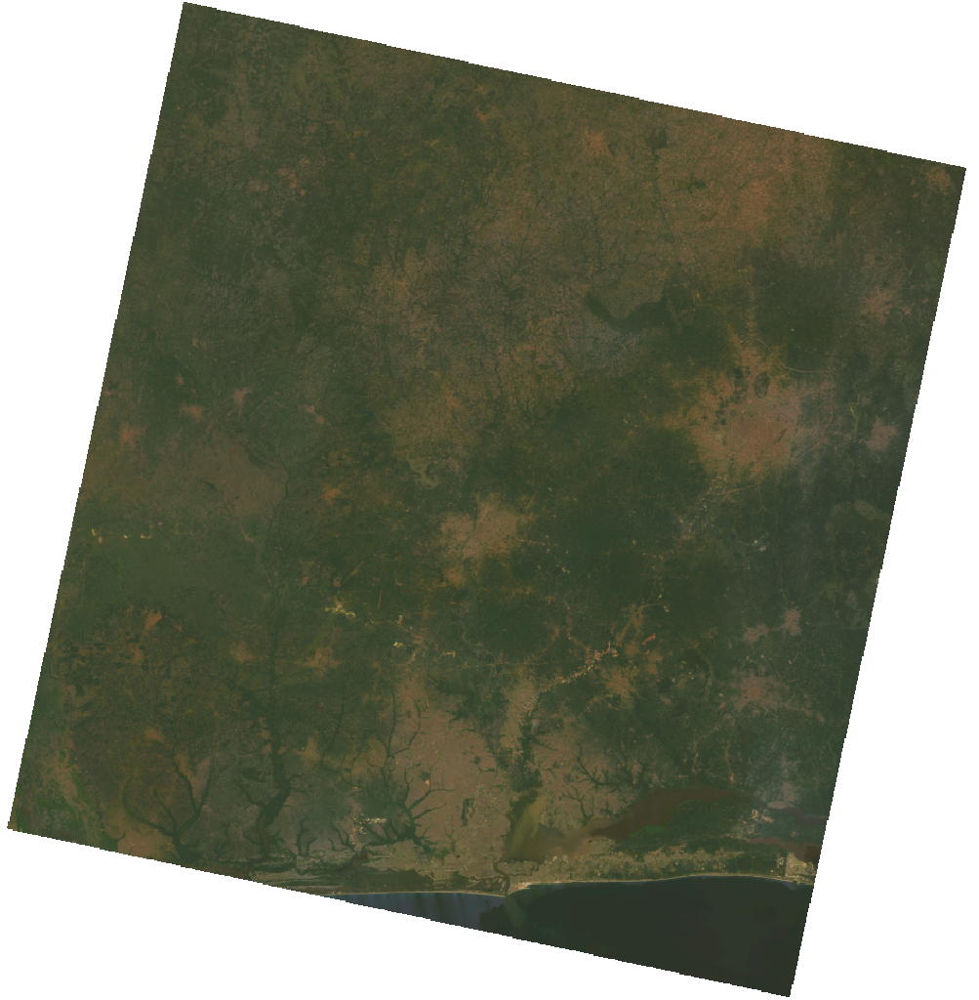

In [17]:
# use Ipython to view image
from IPython.display import Image
Image("preview.jpg")

In [18]:
stac_load?

Signature:
stac_load(
    items: 'Iterable[pystac.item.Item]',
    bands: 'Optional[Union[str, Sequence[str]]]' = None,
    *,
    groupby: 'Optional[Groupby]' = 'time',
    resampling: 'Optional[Union[str, Dict[str, str]]]' = None,
    dtype: 'Union[DTypeLike, Dict[str, DTypeLike], None]' = None,
    chunks: "Optional[Dict[str, int | Literal['auto']]]" = None,
    pool: 'Union[ThreadPoolExecutor, int, None]' = None,
    crs: 'MaybeCRS' = <odc.geo.types.Unset object at 0x0000020EC5806200>,
    resolution: 'Optional[SomeResolution]' = None,
    anchor: 'Optional[GeoboxAnchor]' = None,
    geobox: 'Optional[GeoBox]' = None,
    bbox: 'Optional[Tuple[float, float, float, float]]' = None,
    lon: 'Optional[Tuple[float, float]]' = None,
    lat: 'Optional[Tuple[float, float]]' = None,
    x: 'Optional[Tuple[float, float]]' = None,
    y: 'Optional[Tuple[float, float]]' = None,
    like: 'Optional[Any]' = None,
    geopolygon: 'Optional[Any]' = None,
    progress: 'Optional[Any]' = None,
  

In [19]:
# creat the bbox boundary
bbox = boundary_dissolved['bbox'].iloc[0]

# select list of all the bands needed we need nir and red for NDVI 
# and band 10 for LST calculation\
bands = ["blue", "green","red", 'nir08', 'lwir11']


# combine all the images into a data cube using the odc stac
data = stac_load(items=results.items(), bands=bands,bbox=bbox, groupby="time")

In [20]:
data

<xarray.Dataset> Size: 59MB
Dimensions:      (y: 465, x: 424, time: 30)
Coordinates:
  * y            (y) float64 4kB 8.217e+05 8.217e+05 ... 8.078e+05 8.078e+05
  * x            (x) float64 3kB 5.922e+05 5.923e+05 ... 6.049e+05 6.049e+05
    spatial_ref  int32 4B 32631
  * time         (time) datetime64[ns] 240B 2014-02-04T10:03:57.599323 ... 20...
Data variables:
    blue         (time, y, x) uint16 12MB 9542 9356 9545 9724 ... 9182 9324 9848
    green        (time, y, x) uint16 12MB 11535 11235 11237 ... 10804 11285
    red          (time, y, x) uint16 12MB 12279 12305 12329 ... 11679 12227
    nir08        (time, y, x) uint16 12MB 15341 14963 14905 ... 14605 15697
    lwir11       (time, y, x) uint16 12MB 48485 48428 48376 ... 47246 47143

In [21]:
data_yearly = data.resample(time="Y").mean()

Visulaise the RGB imagery

GEnerate NDVI and Visualize it

<Figure size 1000x500 with 0 Axes>

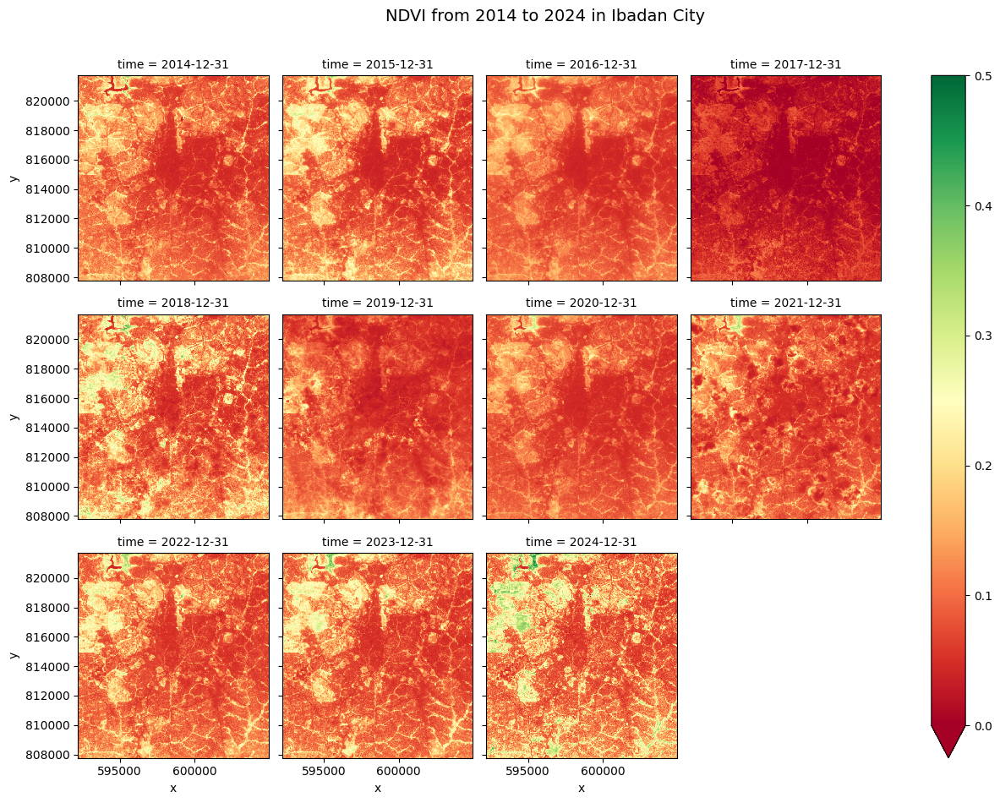

In [22]:
# https://training.digitalearthafrica.org/en/latest/session_4/03_calculate_ndvi_part_2.html
# visualize the ndvi
nir = data_yearly.nir08
red = data_yearly.red

# Calculate NDVI
NDVI = (nir - red) / (nir + red)

# Set figure size
plt.figure(figsize=(10, 5))

# Plot NDVI with 3 rows and 5 columns
NDVI.plot.imshow(col="time", col_wrap=4, vmin=0, vmax=0.5, cmap="RdYlGn")

# Set a global title for all subplots
plt.suptitle("NDVI from 2014 to 2024 in Ibadan City", fontsize=14, y=1.05) 

plt.show();


In [23]:
NDVI

<xarray.DataArray (time: 11, y: 465, x: 424)> Size: 17MB
array([[[0.11086169, 0.0974769 , 0.09458765, ..., 0.11641146,
         0.12481192, 0.13921054],
        [0.10720499, 0.09198727, 0.11115162, ..., 0.13104161,
         0.13164129, 0.14888958],
        [0.09230826, 0.10943798, 0.12010386, ..., 0.13531454,
         0.1279916 , 0.17607718],
        ...,
        [0.16521805, 0.14580907, 0.13675082, ..., 0.13390051,
         0.13246554, 0.12812778],
        [0.17412935, 0.13791799, 0.1319494 , ..., 0.14773565,
         0.14197244, 0.14426204],
        [0.15234701, 0.13763647, 0.13446181, ..., 0.14339036,
         0.13011181, 0.12821112]],

       [[0.096705  , 0.09196738, 0.09280168, ..., 0.11631887,
         0.12817782, 0.14129992],
        [0.09809041, 0.08825363, 0.10965704, ..., 0.14188877,
         0.13637262, 0.16718708],
        [0.08479338, 0.09429786, 0.1153402 , ..., 0.13795473,
         0.13922823, 0.18649356],
...
        [0.19858867, 0.15719614, 0.11621396, ..., 0.10979293,
         0.12938978, 0.11430141],
        [0.20475063, 0.15261823, 0.12648883, ..., 0.10501803,
         0.12328716, 0.13064483],
        [0.15124401, 0.12762575, 0.12802347, ..., 0.11217228,
         0.09544256, 0.09787916]],

       [[0.10329763, 0.09536483, 0.09676263, ..., 0.15432339,
         0.17077051, 0.17434152],
        [0.10143514, 0.08455601, 0.10101554, ..., 0.20283946,
         0.19994089, 0.18035932],
        [0.08053808, 0.08661138, 0.08291186, ..., 0.19205744,
         0.16312978, 0.2057642 ],
        ...,
        [0.26011097, 0.18458403, 0.15834452, ..., 0.13424396,
         0.19515627, 0.16416563],
        [0.22946468, 0.20129752, 0.17456522, ..., 0.13406724,
         0.15369865, 0.18185904],
        [0.20188537, 0.17273231, 0.16774288, ..., 0.15882569,
         0.11132248, 0.12426586]]])
Coordinates:
  * y            (y) float64 4kB 8.217e+05 8.217e+05 ... 8.078e+05 8.078e+05
  * x            (x) float64 3kB 5.922e+05 5.923e+05 ... 6.049e+05 6.049e+05
    spatial_ref  int32 4B 32631
  * time         (time) datetime64[ns] 88B 2014-12-31 2015-12-31 ... 2024-12-31

In [35]:
for no, i in enumerate(data_yearly['lwir11']):
          LST = ((i * 0.00341802 + 149.0) - 273.15)
          LST.rio.to_raster(f"LST_{no}.tif")

Landsurface Temperature

<Figure size 1000x500 with 0 Axes>

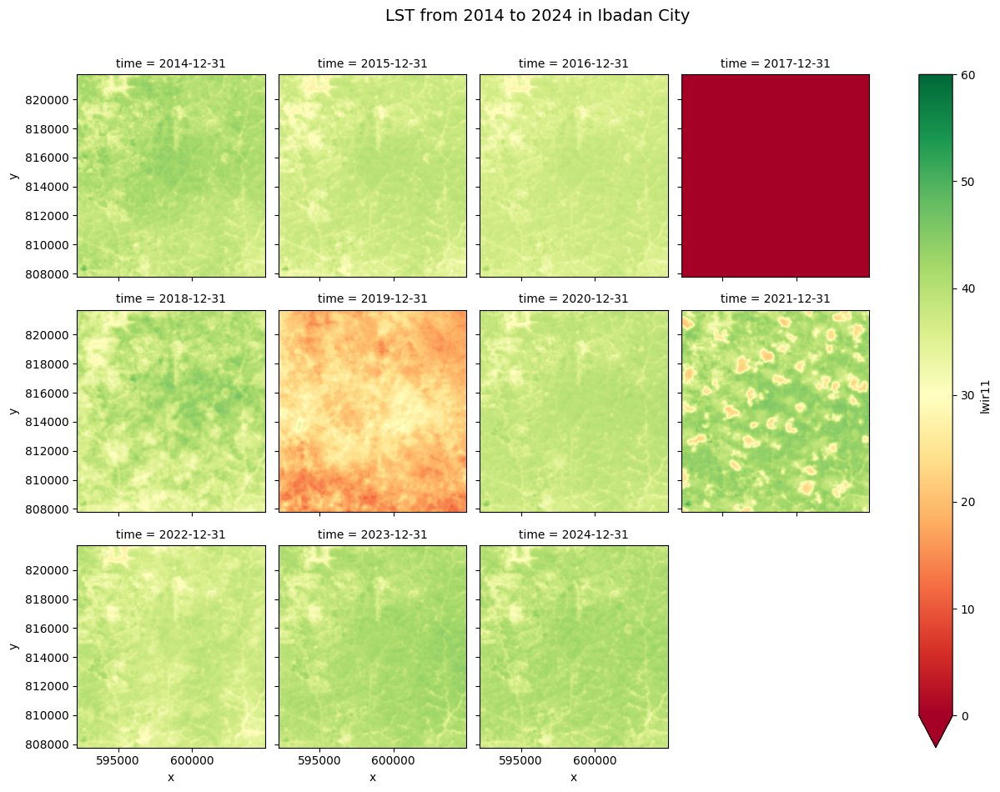

In [30]:
LST = ((data_yearly['lwir11'] * 0.00341802 + 149.0) - 273.15).assign_coords(time=data_yearly['time'])

# Set figure size
plt.figure(figsize=(10, 5))

# Plot LST with 3 rows and 5 columns, assuming 'time' is the dimension
LST.plot.imshow(col="time", col_wrap=4, vmin=0, vmax=60, cmap="RdYlGn")

# Set a global title for all subplots
plt.suptitle("LST from 2014 to 2024 in Ibadan City", fontsize=14, y=1.05)

# Optional: Add axis labels if needed for clarity
plt.xlabel("Longitude")
plt.ylabel("Latitude")

plt.show()

Rainfall

In [25]:
# ## search from rainfall data from eras5
# search_rainfall = catalog.search(
#     collections=["era5-pds"],
#     bbox=bbox,
#     datetime=["2014-01-01"],
#     query={"era5:kind": {"eq": "fc"}}
# )
# items_prec = search_rainfall.get_all_items()
# len(items)


# item = items_prec.items[0]
# item

url = 'https://data.chc.ucsb.edu/products/CHIRPS-2.0/global_monthly/netcdf/byYear/chirps-v2.0.2014.monthly.nc'

In [45]:


# Ensure the DataArray has a name
yearly_avg_NDVI = yearly_avg_NDVI.rename("NDVI_mean")

# Convert xarray DataArray to pandas DataFrame
yearly_avg_NDVI_df = yearly_avg_NDVI.to_dataframe().reset_index()

yearly_avg_NDVI_df.groupby(by='year').mean()

,y,x,spatial_ref,NDVI_mean
year,,,,
2014,814740.0,598575.0,32631.0,0.104508
2015,814740.0,598575.0,32631.0,0.113878
2016,814740.0,598575.0,32631.0,0.093054
2017,814740.0,598575.0,32631.0,0.032468
2018,814740.0,598575.0,32631.0,0.129411
2019,814740.0,598575.0,32631.0,0.081924
2020,814740.0,598575.0,32631.0,0.088672
2021,814740.0,598575.0,32631.0,0.093627
2022,814740.0,598575.0,32631.0,0.114363


Text(0, 0.5, 'Mean NDVI')

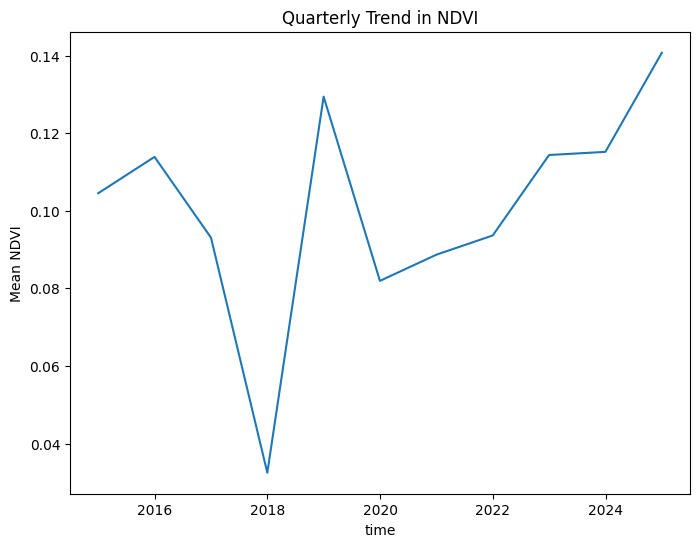

In [ ]:
NDVI.mean(dim=['x', 'y']).plot(size=6)
plt.title('Quarterly Trend in NDVI')
plt.ylabel('Mean NDVI')

Text(0, 0.5, 'Mean LST')

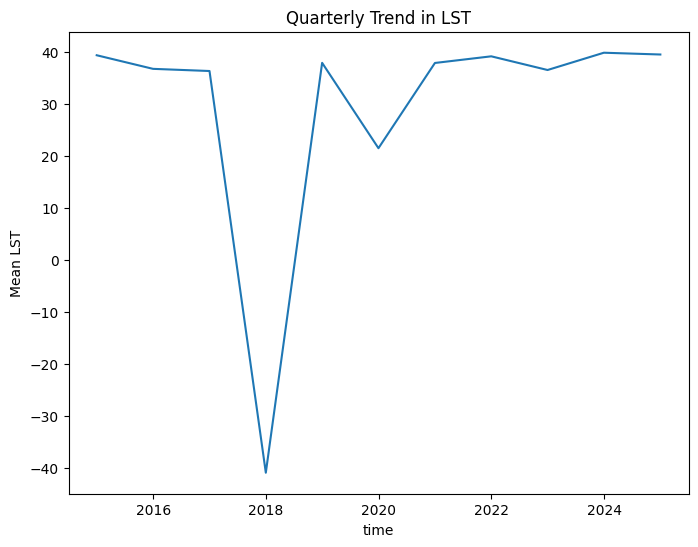

In [27]:
LST.mean(dim=['x', 'y']).plot(size=6)
plt.title('Quarterly Trend in LST')
plt.ylabel('Mean LST')

Export DATA

In [31]:
# download the odc imagery as geotif

# download NDVI
NDVI.rio.to_raster("NDVI_2014_2024.tif")

#download LST image
LST.rio.to_raster("LST_2014_2024.tif")

In [32]:
LST

<xarray.DataArray 'lwir11' (time: 11, y: 465, x: 424)> Size: 17MB
array([[[41.5726997 , 41.37787256, 41.20013552, ..., 38.03163098,
         37.72059116, 37.39929728],
        [41.55219158, 41.34711038, 41.12493908, ..., 37.66932086,
         37.39929728, 37.08483944],
        [41.5214294 , 41.30267612, 40.99847234, ..., 37.26257648,
         36.90368438, 36.64049684],
        ...,
        [37.70350106, 37.61805056, 38.2230401 , ..., 36.24400652,
         36.1380479 , 36.04917938],
        [37.75477136, 37.6248866 , 38.19227792, ..., 36.07310552,
         35.96031086, 35.8304261 ],
        [37.87098404, 37.61121452, 38.30507258, ..., 35.78599184,
         35.66636114, 35.46811598]],

       [[37.70805842, 37.47563306, 37.3400516 , ..., 36.23717048,
         36.20185094, 36.269072  ],
        [37.65678812, 37.3856252 , 37.1976341 , ..., 35.81675402,
         35.6880086 , 35.66863982],
        [37.61007518, 37.29675668, 37.07344604, ..., 35.44532918,
         35.24138732, 35.129732  ],
...
        [36.49694   , 36.79943477, 37.92909038, ..., 40.48235132,
         40.3593026 , 40.34733953],
        [36.69005813, 37.03527815, 38.11366346, ..., 40.41228191,
         40.15763942, 39.88932485],
        [37.18567103, 37.44544055, 38.38710506, ..., 39.94230416,
         39.66886256, 39.29800739]],

       [[40.84466144, 40.62932618, 40.57463786, ..., 39.07412708,
         39.04678292, 39.03994688],
        [40.76262896, 40.48918736, 40.40031884, ..., 38.57851418,
         38.57851418, 38.62294844],
        [40.64641628, 40.35246656, 40.26018002, ..., 37.8983282 ,
         37.85731196, 37.84363988],
        ...,
        [36.24400652, 36.52086614, 37.44031352, ..., 38.6161124 ,
         38.26747436, 38.11366346],
        [36.62340674, 36.7703816 , 37.74109928, ..., 38.21278604,
         37.94618048, 37.58728838],
        [37.08825746, 37.23523232, 38.11708148, ..., 37.48474778,
         37.33777292, 36.98571686]]])
Coordinates:
  * y            (y) float64 4kB 8.217e+05 8.217e+05 ... 8.078e+05 8.078e+05
  * x            (x) float64 3kB 5.922e+05 5.923e+05 ... 6.049e+05 6.049e+05
    spatial_ref  int32 4B 32631
  * time         (time) datetime64[ns] 88B 2014-12-31 2015-12-31 ... 2024-12-31